Deleting all stuff not essential for vae integration (sine experiments, etc)

In [1]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import matplotlib
import torchvision

import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
matplotlib.use('Agg')
"""
%load_ext autoreload
%autoreload 2
%matplotlib inline"""

/usr/lib/python3/dist-packages/matplotlib/__init__.py:1403: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


'\n%load_ext autoreload\n%autoreload 2\n%matplotlib inline'

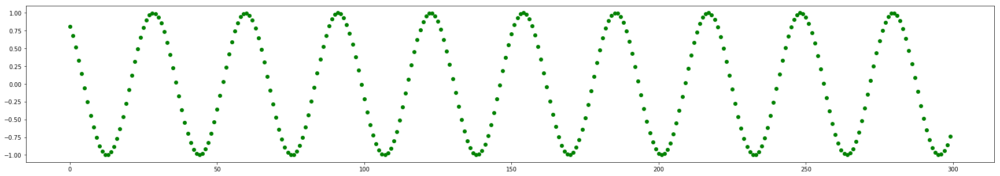

(500, 300)

In [2]:
# Generate training data
np.random.seed(23)

T = 5

# these are set to one more than necessary. We set them again later.
L = 300 # to create X and y, need to pad by one
N = 500 # when zipping together, lose one.

noise = np.random.uniform(-0.1, 0.1, (N, L)).astype(np.float32)

x = np.empty((N, L), 'float32')
x[:] = np.array(range(L)) + np.random.randint(-4 * T, 4 * T, N).reshape(N, 1)
data = np.sin(x / 1.0 / T).astype('float64') #+ noise

plt.figure(figsize=(30,5))
plt.plot(np.arange(L), data[0], 'go', alpha=1, markerfacecolor='green')
plt.show()

data.shape

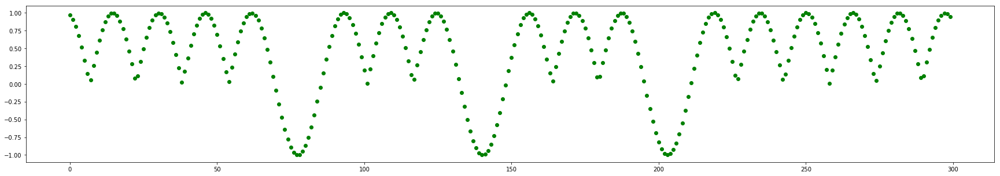

(500, 300)

In [3]:
# create new dataset by randomly inverting waves to create challenge only MDN can handle
rand_data = []
for ii in range(len(data)):
    seq = data[ii]
    dd = [seq[0]]
    invert = False
    for i in range(1, len(data[0])):
        d = seq[i]; d_prev = seq[i-1]
        if d < 0 and d_prev > 0 and np.random.random() > .50: invert = True
        elif d > 0 and d_prev < 0: invert = False
        if invert: dd.append(seq[i]*-1)
        else: dd.append(seq[i])
    rand_data.append(dd)
plt.figure(figsize=(30,5))
plt.plot(np.arange(L), rand_data[1], 'go', alpha=1, markerfacecolor='green')
plt.show()

# overwriting original data
data = np.array(rand_data); data.shape

In [4]:
N-=1; L-=1

In [6]:
# zip arrays into arrays of two dims each.
data_mult_dim = []
for i in range(N): 
    data_mult_dim.append([list(a) for a in zip(data[i], data[i+1])])
data_mult_dim = torch.Tensor(np.array(data_mult_dim)); 

In [2]:
# Loading z seqs from VAE. Same shape, essence as sine waves above.

data_mult_dim = torch.load('z_seq_9.4b.pt')

data_mult_dim.shape # bs, seq len, num latents

torch.Size([3000, 222, 100])

In [49]:
data_mult_dim.view(100, -1).shape

torch.Size([100, 666000])

In [7]:
d_mean = data_mult_dim.mean(dim=0).mean(dim=0)

d_max = data_mult_dim.max()

data_norm = (data_mult_dim - d_mean.unsqueeze(0).unsqueeze(0) ) / d_max.unsqueeze(0).unsqueeze(0)

In [8]:
# Works on entire data (multiple seqs) or on single seq
def denorm(normalized_data):
    return (normalized_data * d_max.unsqueeze(0).unsqueeze(0)) + d_mean.unsqueeze(0).unsqueeze(0)

In [32]:
torch.clamp(data_norm, max=1, min=-1).min()

tensor(-1.)

In [9]:
# Create dataloader from whichever data we choose

bs = 20
dataloader = DataLoader(data_norm, batch_size=bs, shuffle=True) 

In [83]:
# Model. MUST MANUALLY CHANGE N_IN to reflect size of z

N_IN = 100; N_HIDDEN = 512; N_GAUSSIANS = 5; N_LSTM_LAYERS = 2

class LSTM(nn.Module):
    def __init__(self):
        super(LSTM, self).__init__()
        
        self.lstm = nn.LSTM(N_IN, N_HIDDEN, num_layers=N_LSTM_LAYERS) 
        # this outputs the hidden state, which must be run through linear for result.
        
        self.z_pi = nn.Linear(N_HIDDEN, N_GAUSSIANS*N_IN)
        self.z_sigma = nn.Linear(N_HIDDEN, N_GAUSSIANS*N_IN)
        self.z_mu = nn.Linear(N_HIDDEN, N_GAUSSIANS*N_IN)

    def forward(self, input_package): 
        x, hidden = input_package[0], input_package[1]
        
        # "out" will give you access to all hidden states in the sequence
        # "hidden" will allow you to continue the sequence and backpropagate,
        # by passing it as an argument  to the lstm at a later time
        
        # understand these mechanics more.
        out, hidden = self.lstm(x, hidden) # i was confusing what was h_t, c_t. Do more research on this

        # also predicting distributions to draw from for MDN
        pi = self.z_pi(out) # output of linear is all mushed together. separating out.
        
        # Do i even need softmax here? Moved this into loss function itself
        #pi = F.softmax(pi, dim=2) #ONNX can't handle dim 2
        
        #pi = pi / TEMPERATURE
        
        sigma = self.z_sigma(out)
        sigma = torch.exp(sigma)
        #sigma = sigma * (TEMPERATURE ** 0.5)
        
        mu = self.z_mu(out)
        
        return [pi, mu, sigma], hidden

In [92]:
# init model

lstm = LSTM(); 

if torch.cuda.is_available():
    print("cuda available")
    lstm.cuda()

cuda available


In [101]:
    
#from ctallec world models implementation
optimizer = optim.RMSprop(lstm.parameters(), lr=1e-4, alpha=.9) 

#optimizer = optim.SGD(lstm.parameters(), lr=0.001)

In [12]:
def make_hidden(n_seqs):
    # Before we've done anything, we dont have any hidden state.
    # The axes semantics are (num_layers, minibatch_size, hidden_dim)
    return (torch.zeros(N_LSTM_LAYERS, n_seqs, N_HIDDEN).cuda(), # for cell, there are no layers. for lstm, using single layer
            torch.zeros(N_LSTM_LAYERS, n_seqs, N_HIDDEN).cuda())

In [102]:
# train

lstm.train()
for epoch in range(50): # for each epoch
    print("Epoch", epoch)
    for i, batch in enumerate(dataloader): # for each batch
        
        X = batch[:,:-1,:]; 
        y = batch[:,1:,:] # staggering by one
        
        L = X.size(1)
        
        N_SEQS = X.size(0) # allowing flexibility with batch size
        
        hidden = make_hidden(N_SEQS)
        #lstm.init_hidden(N_SEQS) # always start sequence with fresh hidden state

        X = torch.Tensor(X).transpose(0,1).view(L, N_SEQS, N_IN).cuda()
        # when transitioning to lstm from cell, switching axes all around. insert another dimension L at beginning. Can
        # also use lstm to do one-by-one, in that case L=1.
        input_package = [X, hidden]
        mdn_coefs, hidden = lstm(input_package) # feeding in one at a time from each sequence, marching side by side
        actual_next = torch.Tensor(y).transpose(0, 1).view(L, N_SEQS, N_IN).cuda() # reshape target to match lstm output

        # Moving view acrobatics from inside lstm to facilitate ONNX export
        sequence_loss = mdn_loss_function(mdn_coefs[0].view(X.size(0), X.size(1), N_GAUSSIANS, N_IN), 
                     mdn_coefs[2].view(X.size(0), X.size(1), N_GAUSSIANS, N_IN), 
                     mdn_coefs[1].view(X.size(0), X.size(1), N_GAUSSIANS, N_IN), 
                     actual_next.view(L, N_SEQS, 1, N_IN)) # mdn params are split out, so we're padding a bit to match them up

        lstm.zero_grad()
        sequence_loss.backward()
        nn.utils.clip_grad_norm(lstm.parameters(), 1) # this halts the explosion
        optimizer.step()
        if i % 100 == 0: print("loss: ", sequence_loss.item())

        
#torch.save(lstm.state_dict(), 'lstm.torch')

Epoch 0


/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:33: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.


loss:  -3.347501754760742
loss:  -4.64034366607666
Epoch 1
loss:  -4.769283771514893
loss:  -4.861611843109131
Epoch 2
loss:  -4.9491801261901855
loss:  -4.965688705444336
Epoch 3
loss:  -4.947333812713623
loss:  -4.998649597167969
Epoch 4
loss:  -4.997459411621094
loss:  -4.971408843994141
Epoch 5
loss:  -4.9931135177612305
loss:  -5.172117233276367
Epoch 6
loss:  -5.129075050354004
loss:  -5.0891852378845215
Epoch 7
loss:  -5.078885078430176
loss:  -5.174284934997559
Epoch 8
loss:  -5.201661586761475
loss:  -5.142855644226074
Epoch 9
loss:  -5.142780303955078
loss:  -5.1465044021606445
Epoch 10
loss:  -5.0978922843933105
loss:  -5.1700758934021
Epoch 11
loss:  -5.177172660827637
loss:  -5.231968879699707
Epoch 12
loss:  -5.180297374725342
loss:  -5.0946197509765625
Epoch 13
loss:  -5.042825222015381
loss:  -5.174992561340332
Epoch 14
loss:  -5.190049648284912
loss:  -5.260591983795166
Epoch 15
loss:  -5.225311279296875
loss:  -5.249830722808838
Epoch 16
loss:  -5.199271202087402
loss

In [16]:
for p in lstm.parameters():
    print(p)

Parameter containing:
tensor([[-0.0528,  0.0737,  0.1024,  ..., -0.4462,  0.0695, -0.1491],
        [ 0.1755, -0.5276, -0.0722,  ..., -0.0154, -0.3582, -0.0012],
        [ 0.5094,  0.1564,  0.1503,  ...,  0.3674, -0.2122,  0.4249],
        ...,
        [-0.2935, -0.1974, -0.0634,  ...,  0.0120,  0.2388,  0.1423],
        [ 0.1588, -0.0239, -0.0107,  ...,  0.0781, -0.2224, -0.4232],
        [ 0.2470,  0.3521,  0.2089,  ..., -0.5886,  0.0362, -0.0905]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[ 0.2692,  0.4412, -0.0440,  ..., -0.5023,  0.1109,  0.0789],
        [-0.4101,  0.0916, -0.1296,  ..., -0.5924,  0.1189,  0.1671],
        [ 0.1384,  0.0941,  0.0660,  ..., -0.1376, -0.0919, -0.1695],
        ...,
        [ 0.3387,  0.1627,  0.8258,  ..., -0.9217, -0.3138,  0.1070],
        [ 0.4363,  0.1708,  0.0008,  ..., -0.5309, -0.2870,  0.2493],
        [ 0.2771,  0.1394,  0.2064,  ...,  0.1591,  0.5066,  0.2131]],
       device='cuda:0', requires_grad=True)


In [22]:
# saving model
torch.save(lstm.state_dict(), 'lstm_9.4.torch')

In [55]:
# loading model
lstm.load_state_dict(torch.load("lstm_9.4.torch"))

torch.Size([100])


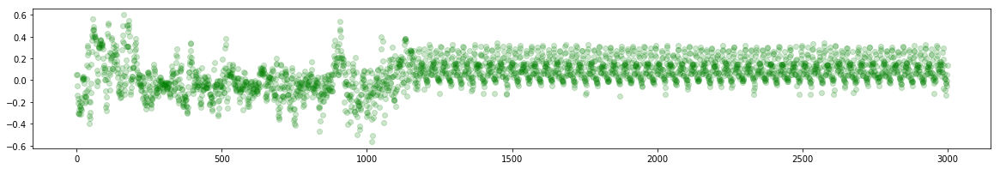

In [103]:
# Predicting the future. Feeding in a single item from a single seq.

N_GEN = 3000

with torch.no_grad():
    
    #lstm.init_hidden(1) # always start sequence with fresh hidden state
    hidden = make_hidden(1)
    lstm.eval()
    
    sample_seq_pred = []

    x = data_norm[0][0] # init w random value from original dataset. WAS FEEDING IN NON NORMALIZED START PT
    print(x.shape)
    gen_z = []
    for i in range(N_GEN): 

        x = x.view(1, 1, N_IN).cuda() # padding to fit into lstm expectation
        input_package = [x, hidden]
        mdn_coefs, hidden = lstm(input_package) # feeding in one at a time from each sequence, marching side by side
        
        # Moving view acrobatics out here to help ONNX
        mdn_coefs[0] = mdn_coefs[0].view(x.size(0), x.size(1), N_GAUSSIANS, N_IN)
        mdn_coefs[1] = mdn_coefs[1].view(x.size(0), x.size(1), N_GAUSSIANS, N_IN)
        mdn_coefs[2] = mdn_coefs[2].view(x.size(0), x.size(1), N_GAUSSIANS, N_IN)
        
        next_z = sample_mdn(mdn_coefs)
        
        gen_z.append(next_z)
        # plotting a single sample for a single dim for a single seq.
        sample_seq_pred.append(next_z[0]) 
        # zipping together again and duplicating to fill out expected N. 
        x = torch.Tensor([next_z]) 


# Plotting a random z component over time
plt.figure(figsize=(20,3))

# all models
plt.plot(np.arange(len(sample_seq_pred)), sample_seq_pred, 'go', alpha=0.2, markerfacecolor='green')

plt.show()

In [104]:
# Changing back to scale and saving

gen_z_denormed = denorm(torch.clamp(torch.Tensor(gen_z), max=1, min=-1)).squeeze(0);

torch.save(gen_z_denormed, open('gen_z_seq_9.5.pt', 'wb'))

In [97]:
gen_z_denormed.shape

torch.Size([300, 100])

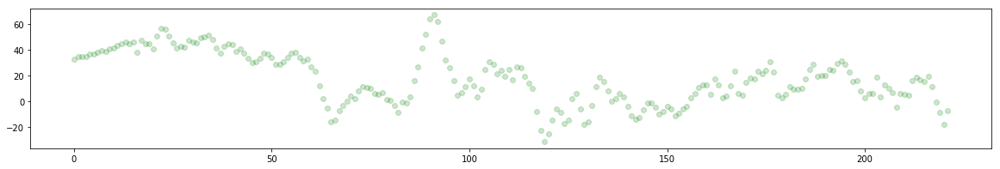

In [52]:
# Testing raw data from 256

sample = data_mult_dim[101].numpy()
# Plotting a random z component over time
plt.figure(figsize=(20,3))

# all models
plt.plot(np.arange(len(sample)), sample[:, 4], 'go', alpha=0.2, markerfacecolor='green')

plt.show()

In [1]:
# Testing GEN data from 256

sample = gen_z_denormed.numpy()
# Plotting a random z component over time
plt.figure(figsize=(20,3))

# all models
plt.plot(np.arange(len(sample)), sample[:, 14], 'go', alpha=0.2, markerfacecolor='green')

plt.show()

NameError: name 'gen_z_denormed' is not defined

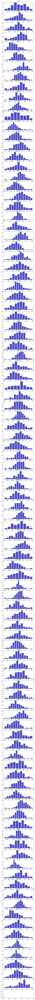

In [25]:
# Testing ACTUAL data z distributions. 256

z_seq = data_mult_dim[0] 
fig, axes = plt.subplots(len(z_seq[0]), 1, figsize=(6,200))

for i in range(len(z_seq[0])-1):
    ax = axes[i]
    ax.hist(x=z_seq[:,i], bins='auto', color='#0506aa', alpha=0.7, rwidth=0.85)
    ax.set_title('Z # '+str(i))

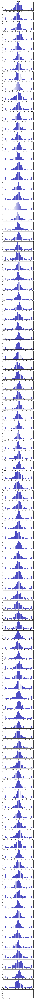

In [41]:
# Testing z seq gen preds. 256

fig, axes = plt.subplots(len(gen_z_denormed[0]), 1, figsize=(6,200))

for i in range(len(gen_z_denormed[0])-1):
    ax = axes[i]
    ax.hist(x=gen_z_denormed[:,i], bins='auto', color='#0504aa', alpha=0.7, rwidth=0.85)
    ax.set_title('Z # '+str(i))

In [77]:
data_mult_dim_64 = torch.load('z_seq.pt')

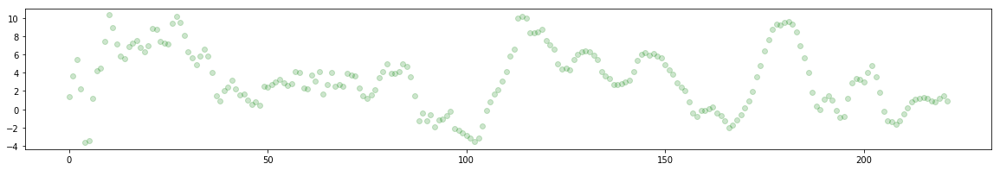

In [82]:
# Testing raw data from 64

sample = data_mult_dim_64[4].numpy()
# Plotting a random z component over time
plt.figure(figsize=(20,3))

# all models
plt.plot(np.arange(len(sample)), sample[:, 9], 'go', alpha=0.2, markerfacecolor='green')

plt.show()

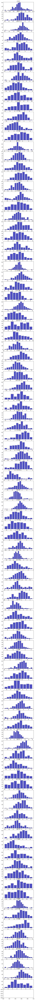

In [30]:
# Testing z seq ACTUAL. 64

z_seq = sample
fig, axes = plt.subplots(len(z_seq[0]), 1, figsize=(6,200))

for i in range(len(z_seq[0])-1):
    ax = axes[i]
    ax.hist(x=z_seq[:,i], bins='auto', color='#0506aa', alpha=0.7, rwidth=0.85)
    ax.set_title('Z # '+str(i))

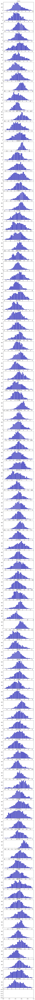

In [16]:
# Testing gen pred 64

z_seq = torch.load('gen_z_seq.pt').numpy()

fig, axes = plt.subplots(len(z_seq[0]), 1, figsize=(6,200))

for i in range(len(z_seq[0])-1):
    ax = axes[i]
    ax.hist(x=z_seq[:,i], bins='auto', color='#0506aa', alpha=0.7, rwidth=0.85)
    ax.set_title('Z # '+str(i))

In [15]:
# Making own sample function. Verify this, good chance I don't understand it fully.

def sample_mdn(mdn_coefs):
    pi = mdn_coefs[0]; 
    pi = F.softmax(pi, dim=2)
    
    pi = pi.squeeze(0).squeeze(0).permute(1,0)

    pi_ix = torch.distributions.categorical.Categorical(pi).sample().unsqueeze(1);

    mu = mdn_coefs[1].squeeze(0).squeeze(0).permute(1,0); 
    sigma = mdn_coefs[2].squeeze(0).squeeze(0).permute(1,0);

    mu_z = torch.gather(mu, 1, pi_ix).squeeze();
    sigma_z = torch.gather(sigma, 1, pi_ix).squeeze();

    gauss_z = torch.distributions.normal.Normal(mu_z, sigma_z)
    
    return gauss_z.sample().cpu().numpy()

#sample_mdn(mdn_coefs)

In [16]:
from torch.distributions import Normal

# from sonic version
# Check this loss function. Good chance it's wrong.
def mdn_loss_function(out_pi, out_sigma, out_mu, y):
    """
    Mixed Density Network loss function, see : 
    https://mikedusenberry.com/mixture-density-networks
    """
    EPSILON = 1e-6
    
    out_pi = F.softmax(out_pi, dim=2) #ONNX can't handle dim 2

    result = Normal(loc=out_mu, scale=out_sigma)
    result = torch.exp(result.log_prob(y))
    result = torch.sum(result * out_pi, dim=2) #changed this
    result = -torch.log(EPSILON + result)
    return torch.mean(result)


# from dusenberry
# takes in params for a single dim. for single item from single seq. WROTE OWN VERSION NOW TO WORK ON BATCH
def sample_preds(pi, sigmasq, mu, samples=10): # sampling for a single pt
  # rather than sample the single conditional mode at each
  # point, we could sample many points from the GMM produced
  # by the model for each point, yielding a dense set of
  # predictions
  N, K = pi.shape
  _, KT = mu.shape
  T = int(KT / K)
  #out = torch.zeros(N, samples, T)  # s samples per example
  out = torch.zeros(samples)  # s samples per example
  for i in range(N): 
    for j in range(samples):
      # pi must sum to 1, thus we can sample from a uniform
      # distribution, then transform that to select the component
      u = np.random.uniform()  # sample from [0, 1)
      # split [0, 1] into k segments: [0, pi[0]), [pi[0], pi[1]), ..., [pi[K-1], pi[K])
      # then determine the segment `u` that falls into and sample from that component
      prob_sum = 0
      for k in range(K):
        prob_sum += pi.data[i, k]
        if u < prob_sum:
          # sample from the kth component
          for t in range(T):
            sample = np.random.normal(mu.data[i, k*T+t], sigmasq.data[i, k]) # this used to have sqrt
            #sample = np.random.normal(mu.data[i, k*T+t], 0)
            #out[i, j, t] = sample
            out[j] = sample
          break
  return out

## Exporting model

In [16]:
# Exporting model to ONNX 

import torch.onnx

x = data_mult_dim[0][0].view(1, 1, N_IN).cuda()
hidden = make_hidden(1)
input_package = [x, hidden]

lstm(input_package)
torch.onnx.export(lstm, input_package, "lstm2.onnx")

In [3]:
#!pip3 install onnx
#!pip3 install onnx-tf
#!pip3 install tensorflow

In [30]:
# Inspecting the ONNX model

import onnx

# Load the ONNX model
model = onnx.load("lstm2.onnx")

# Check that the IR is well formed
onnx.checker.check_model(model)

# Print a human readable representation of the graph
print(onnx.helper.printable_graph(model.graph))

graph torch-jit-export (
  %0[FLOAT, 1x1x2]
  %1[FLOAT, 1x1x512]
  %2[FLOAT, 1x1x512]
) initializers (
  %3[FLOAT, 2048x2]
  %4[FLOAT, 2048x512]
  %5[FLOAT, 2048]
  %6[FLOAT, 2048]
  %7[FLOAT, 10x512]
  %8[FLOAT, 10]
  %9[FLOAT, 10x512]
  %10[FLOAT, 10]
  %11[FLOAT, 10x512]
  %12[FLOAT, 10]
) {
  %14 = Slice[axes = [0], ends = [512], starts = [0]](%3)
  %15 = Slice[axes = [0], ends = [2048], starts = [1536]](%3)
  %16 = Slice[axes = [0], ends = [1536], starts = [512]](%3)
  %17 = Concat[axis = 0](%14, %15, %16)
  %18 = Slice[axes = [0], ends = [512], starts = [0]](%4)
  %19 = Slice[axes = [0], ends = [2048], starts = [1536]](%4)
  %20 = Slice[axes = [0], ends = [1536], starts = [512]](%4)
  %21 = Concat[axis = 0](%18, %19, %20)
  %22 = Slice[axes = [0], ends = [512], starts = [0]](%5)
  %23 = Slice[axes = [0], ends = [2048], starts = [1536]](%5)
  %24 = Slice[axes = [0], ends = [1536], starts = [512]](%5)
  %25 = Concat[axis = 0](%22, %23, %24)
  %26 = Slice[axes = [0], ends = [512], s

In [40]:
# Opening with Tensorflow to save as tensorflow model
import onnx
from onnx_tf.backend import prepare

model = onnx.load("lstm2.onnx")
tf_rep = prepare(model)

In [42]:
tf_rep.

In [5]:
def make_hidden_np(n_seqs):
    # Before we've done anything, we dont have any hidden state.
    # The axes semantics are (num_layers, minibatch_size, hidden_dim)
    return (np.zeros((N_LSTM_LAYERS, n_seqs, N_HIDDEN)), np.zeros((N_LSTM_LAYERS, n_seqs, N_HIDDEN)))


x = data_mult_dim[0][0].view(1, 1, N_IN).cpu().numpy()
hidden = make_hidden_np(1)
input_package = [x, hidden]



tf_rep.run(input_package, )._0

NameError: name 'data_mult_dim' is not defined

In [7]:
import tensorflowjs as tfjs
import tensorflow as tf

In [22]:
tfjs.converters.tf_saved_model_conversion.convert_tf_frozen_model("lstm.pb", "Add_2", "testdir")
#tfjs.converters.tf_saved_model_conversion.load_graph("lstm.pb")

ValueError: Unsupported Ops in the model before optimization
VariableV2, Assign

In [8]:
with tf.gfile.Open("lstm.pb", 'rb') as f:
    graph_def = tf.GraphDef()
    graph_def.ParseFromString(f.read())

In [21]:
graph_def

node {
  name: "Const"
  op: "Const"
  attr {
    key: "dtype"
    value {
      type: DT_FLOAT
    }
  }
  attr {
    key: "value"
    value {
      tensor {
        dtype: DT_FLOAT
        tensor_shape {
          dim {
            size: 2048
          }
          dim {
            size: 2
          }
        }
        tensor_content: "\022r\262\274\375\337F<L\027{\275\202\372\360<m\000\026<\247>\301<\243\226\305=}F[\275\364\022\224\275b\202\201=T\2010=\243\360:\275Ml\024=\352\211\206=\266\001\005<_\277\t=!\313\344<|\244\222;\316\337<\275\'\212\240<\353\257\251\275\017\306\200\275\366\253V\275w\260w=\260\024\n\275p\353\213\272\276\274\017=\2675\t=\036`N< <\244\274\264\000\221=m\360\224;\027\n\224=\235\016m=\r\301o\273,\323\025\275\342}\250;\t\236{=\253.\224\274N\254\244\272\315\234\212<\373\263I\275\221\235\002;\027\027~\275u\335\203=\003\017T=\230\255\207=\t)\245<\021\021+=7\'\345\275\335\024\001\274^\251\021\275z\253\334=\014\"\205=\312\311!\275CC[\2750\360\270\274\361\355\302;a\37

In [12]:
with tf.Graph().as_default() as graph:
    # Set name to empty to avoid using the default name 'import'.
    tf.import_graph_def(graph_def, name='')

In [30]:
graph

In [19]:
unsupported

{'Assign', 'VariableV2'}